# Understanding how NN trains the weights
This notebook is to understand how weights & biases adjust in training

## Observations after tests
1. Each node appears to train for corners in the data set (atleast for LeakyRELU)
2. Even for random training data (InfiniteRandomDataLoader) the NN appears to train node with lowest X values first them moves to higher.
3. Without normalizing f_quartic can lead to good training in 2000 steps by using ReduceLROnPlateau
4. Surprisingly normalizing data made things works for training. I had to add a weights_init function with gain of 10. Even then it took 10x to train (20000 steps) with finer control on LR

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F

In [2]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using mps device


## functions that we are trying to approximate

In [3]:
np.random.seed(10)

# y = ax^4 + bx^3 + cx^2 + dx + f
def f_quartic(x):
    a = -0.0179516
    b = 0.331323
    c = -1.63398
    d = 1.01107
    f = 5.73434
    return a*x**4 + b*x**3 + c*x**2 + d*x + f

def f_inv_quartic(x):
    return 7 - f_quartic(x)
    
def f_semicircle(x):
    maxX = x.max()
    minX = x.min()
    radius = (maxX - minX)/2 
    center = (maxX + minX)/2 
    y = np.sqrt(np.abs(radius**2 - (x-center)**2))
    return y
    
def frand(y):
    return y + y*np.random.uniform(-0.1, 0.1, y.shape).astype('f')

def normalize(x):
    # normalize x & y
    x_factor = x.max() - x.min()
    if(x_factor == 0):
        x_factor = 1
    return x/x_factor

(1250,)

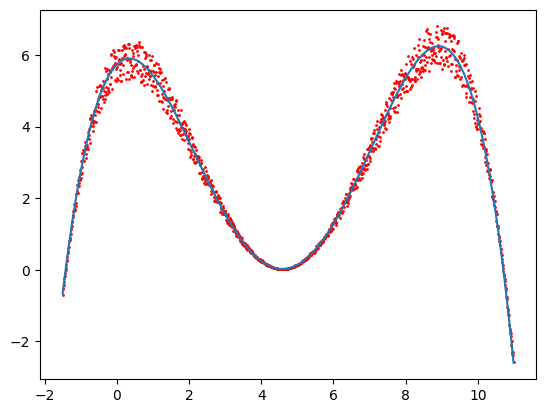

In [4]:
# show data for function 
f = f_quartic

xs = np.arange(-1.5, 11, .01)
ys = f(xs)
yrand = frand(ys)
plt.scatter(xs, yrand, color='red',s=1)
plt.plot(xs, ys)
xs.shape

torch.Size([1250, 1])

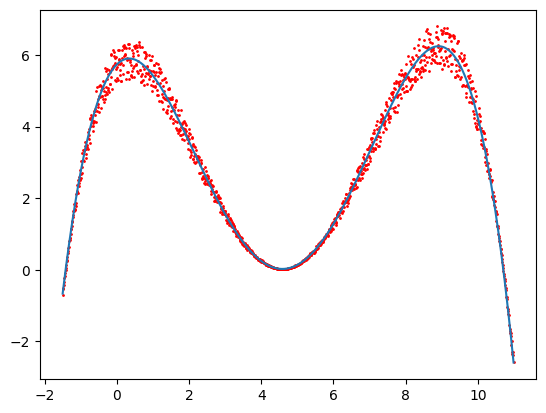

In [5]:
# Test with Tensor
xt = torch.tensor(xs.reshape(xs.shape[0],1), dtype=torch.float32)
yt = torch.tensor(ys.reshape(ys.shape[0],1), dtype=torch.float32)
ytrand = torch.tensor(yrand.reshape(yrand.shape[0],1), dtype=torch.float32)
plt.scatter(xt, ytrand, color='red',s=1)
plt.plot(xt, yt)
xt.shape

## Define Data Loaders (InfiniteRandom and ExtremeLossFirst)

In [6]:
from torch.utils.data.dataloader import DataLoader

class InfiniteRandomDataLoader:

    def __init__(self, dataset, loss, **kwargs):
        train_sampler = torch.utils.data.RandomSampler(dataset, replacement=True, num_samples=int(1e10))
        self.train_loader = DataLoader(dataset, sampler=train_sampler, **kwargs)
        self.data_iter = iter(self.train_loader)

    def next(self):
        try:
            batch = next(self.data_iter)
        except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            self.data_iter = iter(self.train_loader)
            batch = next(self.data_iter)
        return batch


In [7]:
""" ExtremeLossFirstDataloader:
    init should be called in every epoc (ie when we exhaust all samples).
    in init() we find out loss and order data in reverse order of loss
    next() fetches batches of data in order of sorting.
"""
class ExtremeLossFirstDataloader:

    def __init__(self, dataset, loss, **kwargs):
        # sort dataset based on the loss
        sortedloss, indices = torch.sort(loss, dim=-2,descending=True) #reverse sort loss
        sorted_dataset = torch.index_select(x, 0, torch.reshape(indices,(indices.shape[0],)))
        self.train_loader = DataLoader(sorted_dataset, **kwargs)
        self.data_iter = iter(self.train_loader)

    def next(self):
        try:
            batch = next(self.data_iter)
        except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            self.data_iter = iter(self.train_loader)
            batch = next(self.data_iter)
        return batch

In [8]:
""" TopLossClusterDataloader:
    init should be called in every epoc (ie when we exhaust all samples).
    in init() we find out loss and create batches that are near the top loss (+- batchsize/2).
"""
class TopLossClusterDataloader:

    def __init__(self, dataset, loss, batch_size, **kwargs):
        # sort dataset based on the loss
        sortedloss, indices = torch.sort(loss, dim=-2,descending=True) #reverse sort loss
        self.batch_size = batch_size
        self.make_set(indices, dataset)
        #self.train_loader = DataLoader(toploss_dataset, **kwargs)
        #self.data_iter = iter(self.train_loader)

    def make_set(self, indices, dataset):
        index = indices[0]
        start = max(0, index - int(self.batch_size/2))
        stop = min(indices.max(), index + int(self.batch_size/2)) -1
        if start-stop < self.batch_size:
            if(start == 0):
                stop = start + self.batch_size
            elif (stop == indices.max()):
                start = stop - self.batch_size

        self.toploss_dataset = dataset[start:stop+1]
        return 
        
    def next(self):
        #try:
        batch = self.toploss_dataset
        #except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            #self.data_iter = iter(self.train_loader)
            #batch = next(self.data_iter)
        return batch

In [9]:
# test TopLossClusterDataloader
#dataLoader = TopLossClusterDataloader
#batch_loader = dataLoader(dataset,loss=alllosses, batch_size=64, pin_memory=True, num_workers=1)
#batch_loader.next()

In [10]:
""" TopNLossFirstDataloader:
    init should be called in every epoc (ie when we exhaust all samples).
    in init() we find out loss and order data in reverse order of loss, we use only top 20% of the data with most loss.
    next() fetches batches of data in order of sorting.
"""
class TopNLossFirstDataloader:

    def __init__(self, dataset, loss, **kwargs):
        # sort dataset based on the loss
        sortedloss, indices = torch.sort(allloss,dim=-2,descending=True) #reverse sort loss
        sorted_dataset = torch.index_select(x, 0, torch.reshape(indices,(indices.shape[0],)))
        topNpct = 64 #int(sorted_dataset.shape[0]*.2)
        train_sampler = torch.utils.data.RandomSampler(sorted_dataset[0:topNpct], replacement=True, num_samples=int(1e10))
        self.train_loader = DataLoader(dataset, sampler=train_sampler, **kwargs)
        self.data_iter = iter(self.train_loader)
        
    def next(self):
        try:
            batch = next(self.data_iter)
        except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            self.data_iter = iter(self.train_loader)
            batch = next(self.data_iter)
        return batch

## Define the neural network model

In [11]:
# Replaced fc2 linear layer with sum but didn't train well. FAILED EXPERIMENT
class OneHiddenLayerSumNet(nn.Module):
    def __init__(self, input_size, hidden1_size, output_size):
        super(OneHiddenLayerSumNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), negative_slope=0.1)
        return torch.sum(x, 1).reshape(x.shape[0],1) 

In [12]:
# TODO Replace leaky_relu with double sided leaky relu so the slope is confined between two biases - EXPERIMENT
class OneHiddenLayerDlruNet(nn.Module):
    def __init__(self, input_size, hidden1_size, output_size):
        super(OneHiddenLayerSumNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), negative_slope=0.1)
        return torch.sum(x, 1).reshape(x.shape[0],1) 

In [13]:
# observation: Training is very sensitive to negative_slope, if you go outside 0.09 to 1.1 range for negative slope model stops learning
## couldn't train after normalizing
class OneHiddenLayerNet(nn.Module):
    def __init__(self, input_size, hidden1_size, output_size):
        super(OneHiddenLayerNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)
        self.fc2 = nn.Linear(hidden1_size, output_size)

    def forward(self, x):
        x = self.fc1(x)
        #x = x@self.fc1.weight.T + self.fc1.bias # this is what self.fc1(x) does
        x = F.leaky_relu(x, negative_slope=0.1)
        x = self.fc2(x)
        return x

In [14]:
class TwoHiddenLayerNet(nn.Module):
    def __init__(self, input_size, hidden1_size, hidden2_size, output_size):
        super(TwoHiddenLayerNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)
        self.fc2 = nn.Linear(hidden1_size, hidden2_size)
        self.fc3 = nn.Linear(hidden2_size, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), negative_slope=0.1)
        x = F.leaky_relu(self.fc2(x), negative_slope=0.1)
        x = self.fc3(x)
        return x

In [115]:
# My activation function which is like inverse leaky_relu. it has a trainable parameter that chops the linear function output
# Chop(x) = min(x, drop_slope*x + alpha)
class Chop(nn.Module):
    r"""
    Chop(input, drop_slope=0.1)
    """
    def __init__(self, in_features, drop_slope: float = 0.1):
        super(Chop, self).__init__()
        self.drop_slope = drop_slope
        # Define a trainable parameter
        self.alpha = nn.Parameter(2.*torch.ones(1, in_features))  # Initialized with ones, but you can choose a different initialization
    def forward(self, x):
        y = torch.min(x,  self.alpha)
        y[y == self.alpha] = 0
        return y


In [16]:
# Hidden layer with Chop 
# Note ChopNet works, trains slowly and needs more understanding of why or how to train quickly
#needed normalizing?
class OneHiddenLayerChopNet(nn.Module):
    def __init__(self, input_size, hidden1_size, output_size):
        super(OneHiddenLayerChopNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)
        self.ch1 = Chop(hidden1_size, drop_slope=0.1)
        self.fc2 = nn.Linear(hidden1_size, output_size)

    def forward(self, x):
        x = self.fc1(x)
        x = self.ch1(x)
        x = self.fc2(x)
        return x

#### testing

In [17]:
tensor_1d = torch.rand(4)

In [18]:
tensor_1d[2] = 10

In [19]:
tensor_1d

tensor([ 0.8743,  0.0475, 10.0000,  0.2444])

In [20]:
torch.min(tensor_1d, torch.tensor([2]) + torch.tensor([0.1])*tensor_1d) 

tensor([0.8743, 0.0475, 3.0000, 0.2444])

In [21]:
torch.min(tensor_1d, torch.tensor([0.1])*tensor_1d + torch.tensor([0.5])) 

tensor([0.5874, 0.0475, 1.5000, 0.2444])

In [22]:
#model.ch1.alpha, tensor_1d

NameError: name 'model' is not defined

In [ ]:
#model.ch1.forward(tensor_1d)

### Model helper functions

In [23]:
# for single hidden layer model each neuron trains for one vertex (ie change in slope) if we use RELU like functions
# The X coordinate for this vertex is given by -1*bias/weight for each neuron. This function returns that value
# Y location is a bit tricky as it is a sum of all Y for each neuron equation. That is what the function predicts
#
def get_vertices(model):
    with torch.no_grad():
        x_for_vertices = np.zeros_like(model.fc1.bias.detach().numpy())
        bias = model.fc1.bias.detach().numpy()
        weight = model.fc1.weight.detach().reshape(model.fc1.out_features).numpy()
        for i in range(bias.shape[0]):
            x_for_vertices[i] = -1*bias[i]/weight[i]
    return x_for_vertices

#capture model's weights and biases so we can see training progress
def get_params(model):
   # x_for_vertices = np.zeros_like(model.fc1.bias.detach().numpy())
   # fc1_bias = model.fc1.bias.detach().numpy()
   # fc1_weight = model.fc1.weight.detach().reshape(model.fc1.out_features).numpy()
   # fc2_bias = model.fc2.bias.detach().numpy()
   # fc2_weight = model.fc2.weight.detach().reshape(model.fc1.out_features).numpy()
   # params = np.array([fc1_weight])
   # params = np.append(params,fc1_bias)
   # params = np.append(params,fc2_weight)
   # params = np.append(params,fc2_bias)

    return np.array(params).reshape(1,params.size)

# Define your weight initialization function - Didn't work well. only default init (without this function worked best)
def weights_init(m):
    if isinstance(m, nn.Linear):
        nn.init.kaiming_uniform_(m.weight)
        m.bias.data.fill_(0.1)

## Model Training with random data loader

### init training

In [135]:
# init training
import time
from torch.optim.lr_scheduler import ReduceLROnPlateau
import copy

torch.manual_seed(10)
#model = OneHiddenLayerNet(1, 4, 1)
model = OneHiddenLayerChopNet(1, 4, 1) # works
#model = TwoHiddenLayerNet(1, 3, 3, 1)
#model.apply(weights_init) # created problems for oneHiddenLayerNet itself!!

# Capture params after initialization
model_params = []
model_params.append(copy.deepcopy(model.state_dict()))

dataLoader = InfiniteRandomDataLoader

# init optimizer
criterion = nn.MSELoss(reduction='mean')

# testing if normalizing data help train faster. unfortunately it was worse
#xs = normalize(xs) # couldn't train after normalizing
#ys = normalize(ys)

x = torch.tensor((xs).reshape(xs.shape[0],1), dtype=torch.float32)
ytest = torch.tensor((ys).reshape(ys.shape[0],1), dtype=torch.float32) # y is from function / not randomized
# create dataset that can be used in a dataloader 
dataset = torch.utils.data.TensorDataset(x, ytest)

#initialize training params
step = 0
losses = np.array([])
with torch.no_grad():
    y = model(x)
    total_mean_loss = criterion(y, ytest)
    losses = np.append(losses, total_mean_loss)
     
x_for_vertices = np.zeros([1,model.fc1.out_features])
x_for_vertices[0] = get_vertices(model) # Capture the random init state

# optimizer an scheduler
lr=.20
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8)
#scheduler = ReduceLROnPlateau(optimizer, 'min', factor=.5, patience=50,threshold=0.001, threshold_mode='rel', cooldown=0, 
#                                                 min_lr=0, eps=1e-08, verbose=True) # let us try scheduler to reduce learning rate
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=.5, patience=500,threshold=0.001, threshold_mode='rel', cooldown=0, 
                                                 min_lr=0, eps=1e-08, verbose=True) # let us try scheduler to reduce learning rate

### Training loop

In [136]:
# training loop

best_loss = .01
prev_total_mean_loss = 100
max_steps = 1000

# init dataloader
batch_loader = dataLoader(dataset,loss=None, batch_size=64, pin_memory=True, num_workers=1)

while True:
    t0 = time.time()
    # get the next batch, ship to device, and unpack it to input and target
    X, Y = batch_loader.next()
    #check for NaN
    if math.isnan(Y.mean()):
        print ("Breaking for NaN")
        break

    # Forward pass
    ypred = model(X)

    # Calculate the loss
    loss = criterion(ypred, Y)
 
    # Backward and optimize
    model.zero_grad(set_to_none=True)
    loss.backward()

    # Evaluate model after this optimizer.step
    # we evaluate on complete data
    with torch.no_grad():
        y = model(x)
        total_mean_loss = criterion(y, ytest)
        losses = np.append(losses, total_mean_loss)
    
    optimizer.step() #not needed is we have scheduler, I think
    step += 1
    scheduler.step(total_mean_loss)
    t1 = time.time()

    # store params (weights and biases) after each training step
    x_for_vertices = np.append(x_for_vertices,np.array([get_vertices(model)]), axis=0)
    if step % 10 == 0:
        model_params.append(copy.deepcopy(model.state_dict()))
             
    # logging
    if step % 100 == 0:         
        print(f"step {step} | loss {loss:.4f} | total_mean_loss {total_mean_loss:.4f} | step time {(t1-t0)*1000:.2f}ms")

    # termination conditions
    if max_steps >= 0 and step % max_steps == 0:
        break
        
    #if total_mean_loss.mean() < best_loss:
        break

    #if total_mean_loss.mean() > prev_total_mean_loss*1.5:
    #    break #we may want to change learning rate

    prev_total_mean_loss = total_mean_loss


step 100 | loss 3.7759 | total_mean_loss 3.5511 | step time 0.49ms
step 200 | loss 3.2537 | total_mean_loss 2.9367 | step time 0.52ms
step 300 | loss 2.3757 | total_mean_loss 2.9259 | step time 0.48ms
step 400 | loss 2.1102 | total_mean_loss 2.4838 | step time 0.49ms
step 500 | loss 1.6137 | total_mean_loss 1.8816 | step time 0.51ms
step 600 | loss 1.7616 | total_mean_loss 1.6726 | step time 0.49ms
step 700 | loss 1.4785 | total_mean_loss 1.7283 | step time 0.47ms
step 800 | loss 1.5203 | total_mean_loss 1.6152 | step time 0.48ms
step 900 | loss 2.2881 | total_mean_loss 1.5089 | step time 1.38ms
step 1000 | loss 1.7057 | total_mean_loss 1.6360 | step time 0.49ms


 prev_total_mean_loss  tensor(1.7244)


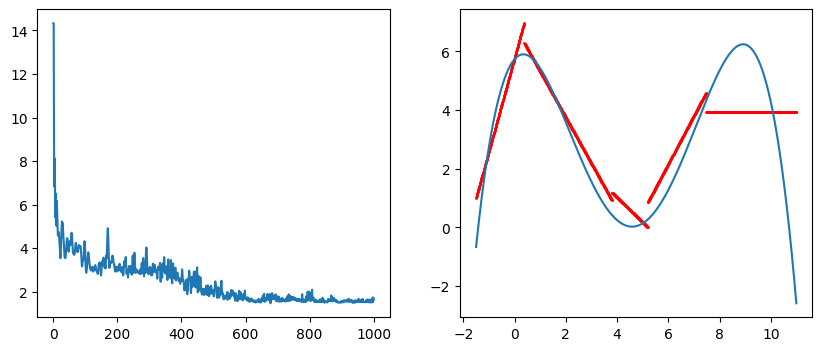

In [137]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10, 4) # this is done to increase width to 

# Create a figure and two axes objects
# Increase the figure size to accommodate wider plots
fig, (ax1, ax2) = plt.subplots(1, 2)

# plot loss
print (" prev_total_mean_loss ",prev_total_mean_loss)
ax1.plot(losses)

# plot trained model
y = model(x)
yout = y.data.reshape(xs.shape[0])
ax2.plot(xs, ys)
ax2.scatter(xs, yout, color='red', s=1)

# Display the plot
plt.show()

### plot how the vertices are getting trained

Begin: [-6.82453203 -5.14330053  1.03355849 -4.08017635]
End: [5.09776068 3.90300035 7.62679911 0.11049815]


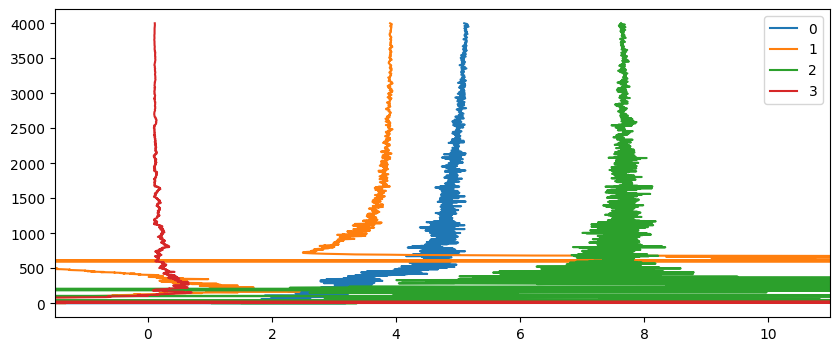

In [123]:
# plot how the vertices are getting trained
print ("Begin:",x_for_vertices[0])
print ("End:",x_for_vertices[-1])

for i in range(x_for_vertices.shape[1]):
    plt.plot(x_for_vertices[0:,i],range(x_for_vertices[0:,0].shape[0]), label=i)

plt.xlim(xs.min(), xs.max())
plt.legend()
plt.show()

## Analyzing model parameters and reconstructing graph with model parameters

### Drawing animation showing how training progress

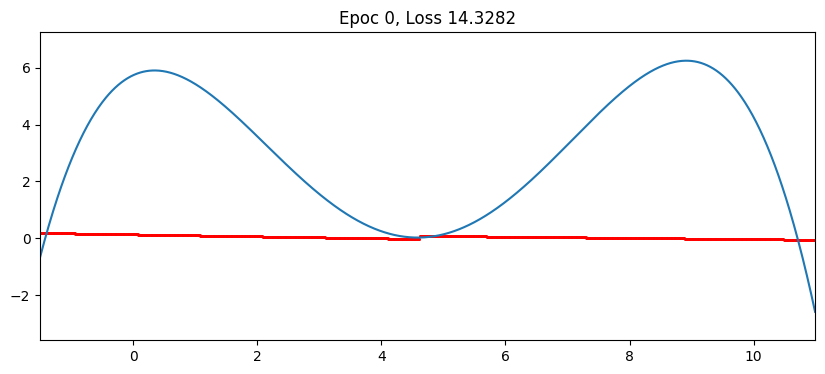

In [124]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots()
ax.set_xlim(xs.min(), xs.max())
ax.set_ylim(ys.min()-1, ys.max()+1)
ax.plot(xs, ys)
scatter = ax.scatter([], [], c='r', s=1)  # Initialize an empty scatter plot

def animate(i):
    model.load_state_dict(model_params[i])
    with torch.no_grad():
        model.eval() # be sure to call model.eval() method before inferencing to set the dropout and batch normalization layers to evaluation mode. Failing to do this will yield inconsistent inference results.
        y = model(x)
    yout = y.data.reshape(xs.shape[0])
    #ax.scatter(xs, yout, color='red', s=1)
    scatter.set_offsets(np.column_stack((xs, yout)))
    ax.set_title(f"Epoc {i*10}, Loss {losses[10*(i)]:.4f}")

anim = FuncAnimation(fig, animate, frames=range(0,len(model_params)))

In [245]:
# Save animation if necessary
anim.save("animation.gif")

In [125]:
from IPython.display import HTML
HTML(anim.to_jshtml())

### Show impact of each fc1 neuron and chop on x

In [126]:
# function to calulates forward pass for first layer and chop
def nnforward(x):
    with torch.no_grad():
        l1 = model.ch1(model.fc1(torch.tensor([x]))).numpy()[0]
        c1 = model.fc2.weight.numpy()[0]
        # individually multiple each value of l1 with c1 to get effect of each l1
        s = np.empty_like(l1)
        i=0
        for a,b in zip(l1, c1):
            s[i] = a*c1
            i+=1
    return s

def nnforward_exp(x):
    with torch.no_grad():
        l1 = model.ch1(torch.tensor([x])).numpy()[0]
        c1 = model.fc2.weight.numpy()[0]
        # individually multiple each value of l1 with c1 to get effect of each l1
        s = np.empty_like(l1)
        i=0
        for a,b in zip(l1, c1):
            s[i] = a*1
            i+=1
    return s
# test nnforward(10.)

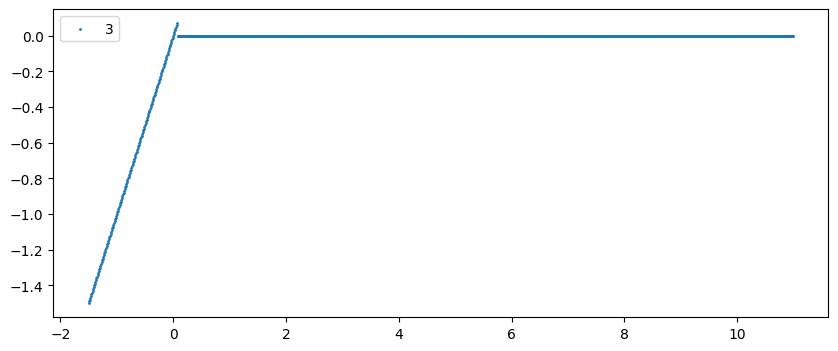

In [132]:
# Create an empty NumPy array
result_array = np.empty((0, model.fc1.out_features))  

for i in range(xs.shape[0]):
    new_data = nnforward_exp(float(xs[i]))
    result_array = np.append(result_array, [new_data], axis=0)

for i in range(model.fc1.out_features):
    plt.scatter(xs, result_array[:,i],s=1,label=i)

plt.legend()
plt.show()

In [128]:
result_array.shape,new_data.shape

((1250, 4), (4,))

In [134]:
result_array[0:100,1]

array([-1.5       , -1.49000001, -1.48000002, -1.47000003, -1.46000004,
       -1.45000005, -1.44000006, -1.42999995, -1.41999996, -1.40999997,
       -1.39999998, -1.38999999, -1.38      , -1.37      , -1.36000001,
       -1.35000002, -1.34000003, -1.33000004, -1.32000005, -1.30999994,
       -1.29999995, -1.28999996, -1.27999997, -1.26999998, -1.25999999,
       -1.25      , -1.24000001, -1.23000002, -1.22000003, -1.21000004,
       -1.20000005, -1.19000006, -1.17999995, -1.16999996, -1.15999997,
       -1.14999998, -1.13999999, -1.13      , -1.12      , -1.11000001,
       -1.10000002, -1.09000003, -1.08000004, -1.07000005, -1.05999994,
       -1.04999995, -1.03999996, -1.02999997, -1.01999998, -1.00999999,
       -1.        , -0.99000001, -0.98000002, -0.97000003, -0.95999998,
       -0.94999999, -0.94      , -0.93000001, -0.92000002, -0.91000003,
       -0.89999998, -0.88999999, -0.88      , -0.87      , -0.86000001,
       -0.85000002, -0.83999997, -0.82999998, -0.81999999, -0.81

In [550]:
range(xs.shape[0])

range(0, 1250)

# Scratch

In [606]:
def chop(x):
    drop_slope = torch.tensor([0.1])
    alpha = torch.tensor([5.])
    y = torch.min(x,  alpha)
    y[y == alpha] = 0
    return y

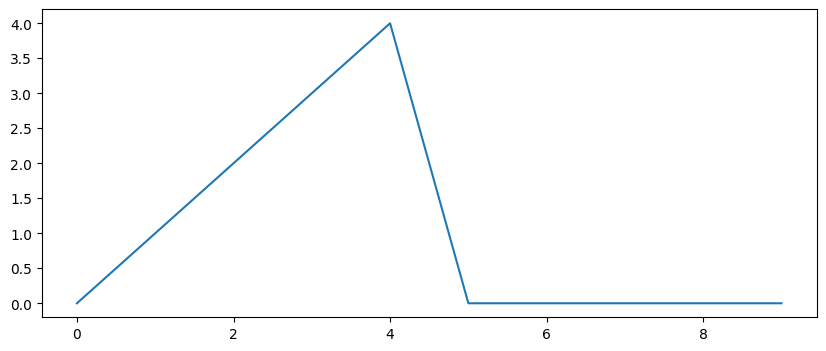

In [607]:
Xt = torch.tensor(range(10))
Yt = chop(Xt)
plt.plot(Xt, Yt)

In [608]:
Xt, Yt

(tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 tensor([0., 1., 2., 3., 4., 0., 0., 0., 0., 0.]))

tensor([0.0000, 1.0000, 2.0000, 3.0000, 4.0000, 4.5000, 4.4000, 4.3000, 4.2000,
        4.1000])

In [455]:
model_params[0],model_params[-1]

(OrderedDict([('fc1.weight',
               tensor([[-0.0838],
                       [-0.0343],
                       [-0.3750],
                       [ 0.2300],
                       [-0.5721],
                       [-0.1763],
                       [ 0.3876],
                       [ 0.9386]])),
              ('fc1.bias',
               tensor([ 0.2356, -0.3393,  0.0959, -0.1121,  0.4082,  0.1145,  0.3917,  0.9699])),
              ('ch1.alpha',
               tensor([[10., 10., 10., 10., 10., 10., 10., 10.]])),
              ('fc2.weight',
               tensor([[-0.1468, -0.0125,  0.0813, -0.0023, -0.0339, -0.3129, -0.3050, -0.3181]])),
              ('fc2.bias', tensor([-0.3459]))]),
 OrderedDict([('fc1.weight',
               tensor([[ 1.3704e+00],
                       [-1.8738e+00],
                       [-1.8607e-01],
                       [ 1.3420e-03],
                       [ 1.5670e-04],
                       [ 1.8090e-02],
                       [ 1.3723e+00],
  

In [532]:
with torch.no_grad():
    x = 10.
    print(model.ch1(model.fc1(torch.tensor([x]))).numpy())
    print(model.fc2.weight.numpy())
    print((model.ch1(model.fc1(torch.tensor([x])))@model.fc2.weight.T).numpy(), model.fc2.bias.numpy())
    print(model(torch.tensor([x])).numpy())

[[-17.874325  10.825917   3.874342  -5.399699]]
[[ 2.1614785   4.2830396  -2.2431462  -0.55123043]]
[[2.0186272]] [1.4619957]
[[3.4806228]]


In [533]:
with torch.no_grad():
    X = model.ch1(model.fc1(torch.tensor([x]))).numpy()
    Y = model.fc2.weight.numpy()

In [540]:
s = 0
for a,b in zip(X[0], Y[0]):
    s += a*b
    print(a*b,a,b)
print (s)

-38.634968 -17.874325 2.1614785
46.367832 10.825917 4.2830396
-8.690716 3.874342 -2.2431462
2.9764786 -5.399699 -0.55123043
2.018627166748047


In [528]:
for name, param in model.named_modules():
    print (f'name = {name}')
    print (f'param = {param}')

name = 
param = OneHiddenLayerChopNet(
  (fc1): Linear(in_features=1, out_features=4, bias=True)
  (ch1): Chop()
  (fc2): Linear(in_features=4, out_features=1, bias=True)
)
name = fc1
param = Linear(in_features=1, out_features=4, bias=True)
name = ch1
param = Chop()
name = fc2
param = Linear(in_features=4, out_features=1, bias=True)


In [393]:
# Show values of weights and biases
for name, param in model.named_parameters():
    if 'weight' in name:
        print(name, '\n', param)
    elif 'bias' in name:
        print(name, '\n', param)

fc1.weight 
 Parameter containing:
tensor([[ 0.7301],
        [-2.6349],
        [-0.8987],
        [-0.5706]], requires_grad=True)
fc1.bias 
 Parameter containing:
tensor([-6.7733, -0.0103,  4.1089,  4.9564], requires_grad=True)
fc2.weight 
 Parameter containing:
tensor([[-5.5534, -2.4540,  3.9643, -3.0588]], requires_grad=True)
fc2.bias 
 Parameter containing:
tensor([1.7087], requires_grad=True)


In [214]:
# Fetch model parameter by name
def fetch_param(name_in):
    for name, param in model.named_parameters():
        if name == name_in:
            weight_tensor = param
            break
    return weight_tensor.detach().numpy()

#leaky relu 
def lru(x):
    if(x < 0):
        return x*0.1
    return x
    
def nnforward(x):
    z11 = lru(x*fetch_param('fc1.weight')[0][0] + fetch_param('fc1.bias')[0])
    z12 = lru(x*fetch_param('fc1.weight')[1][0] + fetch_param('fc1.bias')[1])
    z13 = lru(x*fetch_param('fc1.weight')[2][0] + fetch_param('fc1.bias')[2])
    z14 = lru(x*fetch_param('fc1.weight')[3][0] + fetch_param('fc1.bias')[3])
    
    y1 = fetch_param('fc2.weight')[0,0] * z11
    y2 = fetch_param('fc2.weight')[0,1] * z12
    y3 = fetch_param('fc2.weight')[0,2] * z13
    y4 = fetch_param('fc2.weight')[0,3] * z14
    y5 = fetch_param('fc2.bias')[0]
    y = y1 + y2 + y3 + y4 + y5
    return y, z11, z12, z13, z14, y5

''' My Understanding
For a single layer network each neuron with RELU activation function
1. Represents a line with slope of 0 and another line with slope of fc1.weight*fc2.weight at that neuron.
2. The intesect of these two lines is at x = -fc1.bias/fc1.weight for each neuron in 1st layer.
3. The y value for this neuron is cumulative y of all the neuron lines
'''

' My Understanding\nFor a single layer network each neuron with RELU activation function\n1. Represents a line with slope of 0 and another line with slope of fc1.weight*fc2.weight at that neuron.\n2. The intesect of these two lines is at x = -fc1.bias/fc1.weight for each neuron in 1st layer.\n3. The y value for this neuron is cumulative y of all the neuron lines\n'

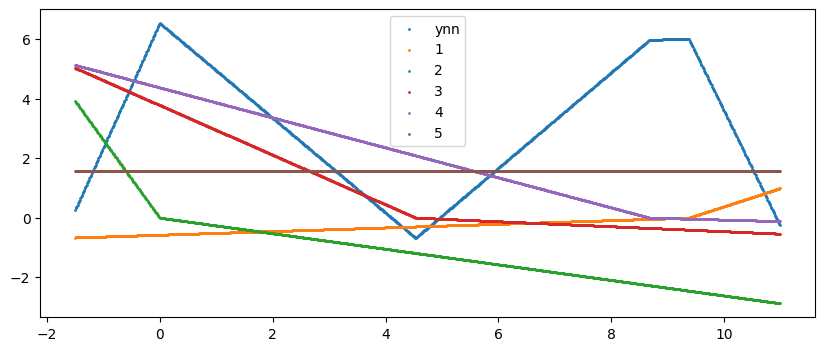

In [216]:
ynn = np.zeros_like(xs)
y1 = np.zeros_like(xs)
y2 = np.zeros_like(xs)
y3 = np.zeros_like(xs)
y4 = np.zeros_like(xs)
y5 = np.zeros_like(xs)

i = 0
for xi in xs:
    ynn[i], y1[i], y2[i], y3[i], y4[i], y5[i]  = nnforward(xi)
    i += 1

# plot trained model
#plt.plot(xs, ys)
#plt.scatter(xs, y2, color='red', s=1) #predicted
plt.scatter(xs, ynn,s=1,label='ynn') #forward prop
plt.scatter(xs, y1,s=1,label='1')
plt.scatter(xs, y2,s=1,label='2')
plt.scatter(xs, y3,s=1,label='3')
plt.scatter(xs, y4,s=1,label='4')
plt.scatter(xs, y5,s=1,label='5')
# Display the plot
plt.legend()
plt.show()